In [1]:
import pandas as pd
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

In [2]:
path1 = Path("/Users/zainabnazari/mfuzz/data")

In [3]:
data_m = pd.read_excel(path1/"merged_de_miRNA.xlsx")

In [4]:
data_m['t0'] = 0

In [5]:
data_m = data_m[['miRNA_ID', 't0', 'FC_2_6', 'FC_6_12']]

In [49]:
data_m["FC_2_6"].max()

6.35648844300346

In [50]:
data_m["FC_2_6"].min()

-6.5503435225499

In [51]:
data_m["FC_6_12"].max()

5.6074085013824

In [52]:
data_m["FC_6_12"].min()

-4.60913549715646

# Classifications

/Users/zainabnazari/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:48: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.


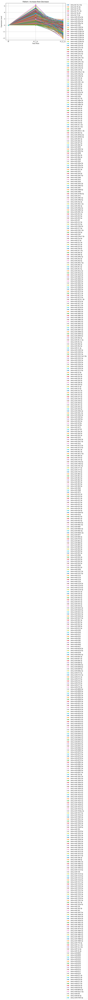

/Users/zainabnazari/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:48: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.


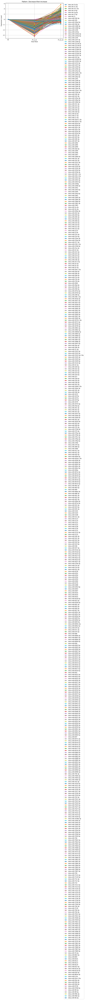

/Users/zainabnazari/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:48: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.


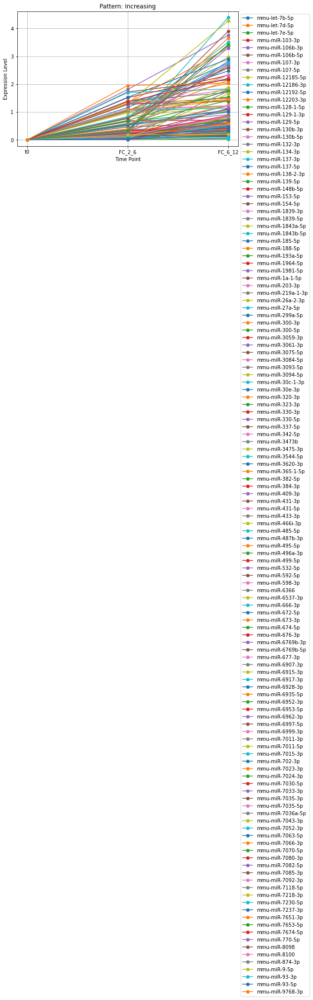

/Users/zainabnazari/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:48: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.


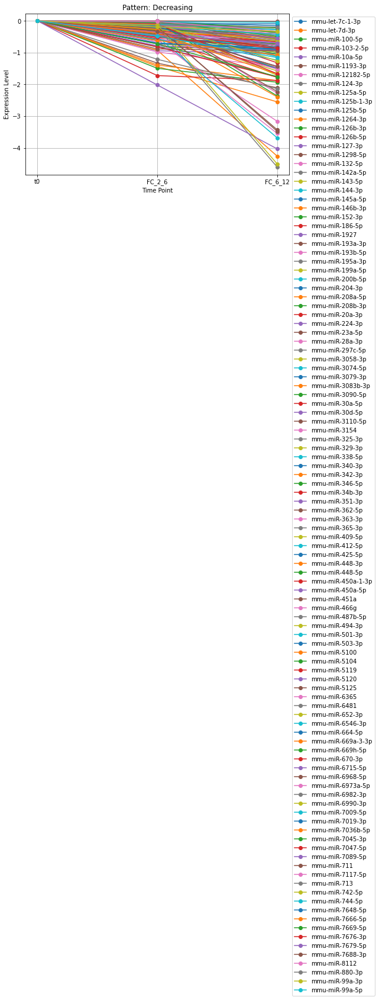

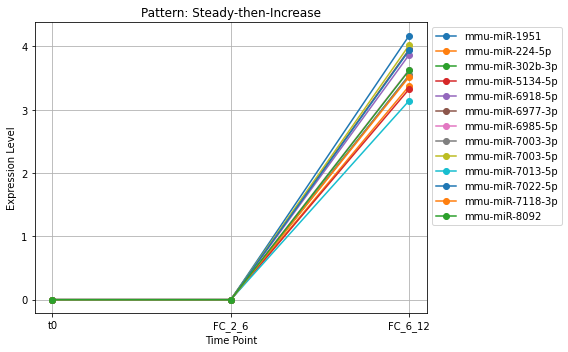

In [6]:


# Example gene expression data
'''
data = pd.DataFrame({
    'gene': ['gene1', 'gene2', 'gene3', 'gene4', 'gene5', 'gene6'],
    't1': [2.0, 3.0, 1.0, 5.0, 2.0, 2.0],
    't2': [3.5, 2.0, 1.0, 5.5, 2.1, 2.1],
    't3': [2.5, 2.5, 3.0, 6.0, 2.8, 1.5]
})

'''

# Classification rule function
def classify_pattern(row, tol=0.0):
    delta1 = row['FC_2_6'] - row['t0']
    delta2 = row['FC_6_12'] - row['FC_2_6']
    
    if delta1 > tol and delta2 < -tol:
        return 'Increase-then-Decrease'
    elif delta1 < -tol and delta2 > tol:
        return 'Decrease-then-Increase'
    elif delta1 > tol and delta2 > tol:
        return 'Increasing'
    elif delta1 < -tol and delta2 < -tol:
        return 'Decreasing'
    elif abs(delta1) <= tol and delta2 > tol:
        return 'Steady-then-Increase'
    elif abs(delta1) <= tol and delta2 < -tol:
        return 'Steady-then-Decrease'
    else:
        return 'Unclassified'

# Apply classification
data_m['pattern'] = data_m.apply(classify_pattern, axis=1)

# Plot all genes with the same pattern in one plot
timepoints = ['t0', 'FC_2_6', 'FC_6_12']
unique_patterns = data_m['pattern'].unique()

for pattern in unique_patterns:
    subset = data_m[data_m['pattern'] == pattern]
    plt.figure(figsize=(8, 5))
    for _, row in subset.iterrows():
        plt.plot(timepoints, row[timepoints], marker='o', label=row['miRNA_ID'])
    plt.title(f'Pattern: {pattern}')
    plt.xlabel('Time Point')
    plt.ylabel('Expression Level')
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.grid(True)
    plt.show()


/Users/zainabnazari/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:50: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.


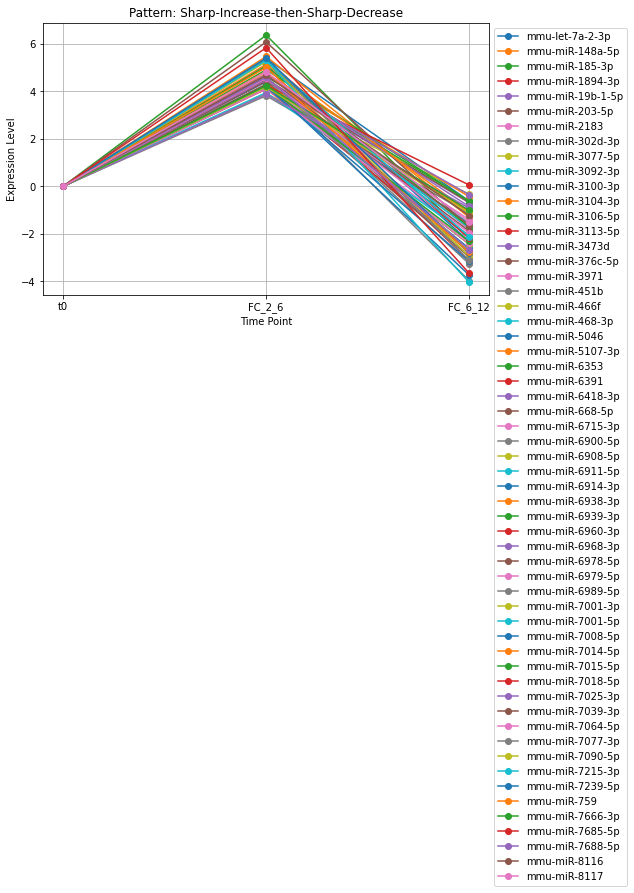

/Users/zainabnazari/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:50: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.


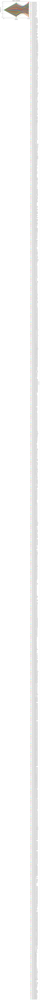

/Users/zainabnazari/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:50: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.


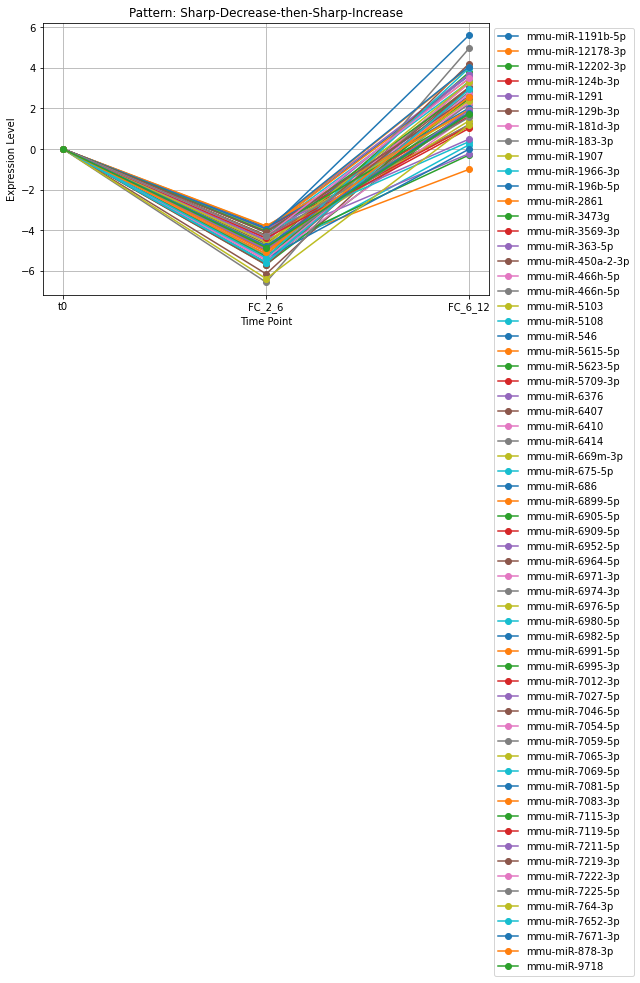

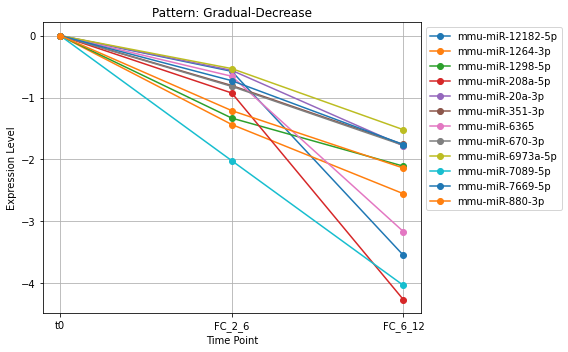

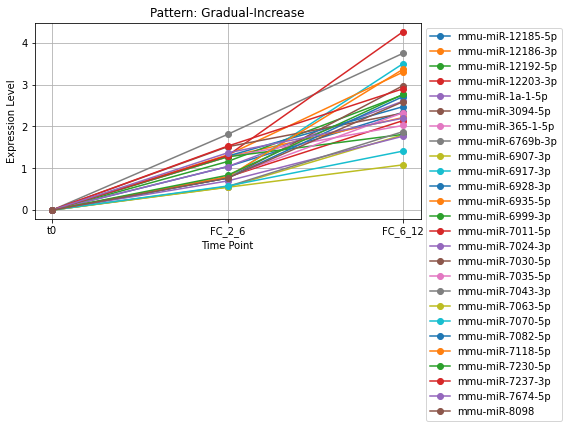

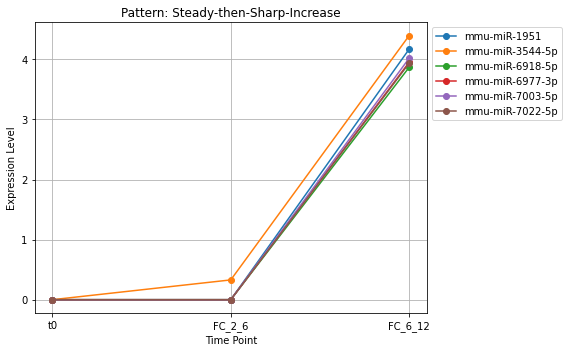

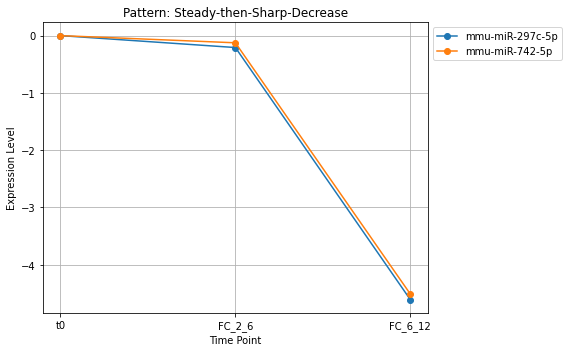

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Helper: compute angle between time points (in degrees)
def compute_angle(delta_expr, delta_time=6.55):
    slope = delta_expr / delta_time
    angle = np.degrees(np.arctan(slope))
    return angle

# Classification function with angles
def classify_pattern(row, angle_thresh=30, steady_thresh=4.5):
    delta1 = row['FC_2_6'] - row['t0']
    delta2 = row['FC_6_12'] - row['FC_2_6']
    
    angle1 = compute_angle(delta1)
    angle2 = compute_angle(delta2)

    if abs(angle1) < steady_thresh and angle2 > angle_thresh:
        return 'Steady-then-Sharp-Increase'
    elif abs(angle1) < steady_thresh and angle2 < -angle_thresh:
        return 'Steady-then-Sharp-Decrease'
    elif angle1 > angle_thresh and angle2 < -angle_thresh:
        return 'Sharp-Increase-then-Sharp-Decrease'
    elif angle1 < -angle_thresh and angle2 > angle_thresh:
        return 'Sharp-Decrease-then-Sharp-Increase'
    elif angle1 > steady_thresh and angle2 > steady_thresh:
        return 'Gradual-Increase'
    elif angle1 < -steady_thresh and angle2 < -steady_thresh:
        return 'Gradual-Decrease'
    else:
        return 'Unclassified'

# Apply classification
data_m['pattern'] = data_m.apply(classify_pattern, axis=1)

# Plot grouped by pattern
timepoints = ['t0', 'FC_2_6', 'FC_6_12']
unique_patterns = data_m['pattern'].unique()

for pattern in unique_patterns:
    subset = data_m[data_m['pattern'] == pattern]
    plt.figure(figsize=(8, 5))
    for _, row in subset.iterrows():
        plt.plot(timepoints, row[timepoints], marker='o', label=row['miRNA_ID'])
    plt.title(f'Pattern: {pattern}')
    plt.xlabel('Time Point')
    plt.ylabel('Expression Level')
    plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.grid(True)
    plt.show()


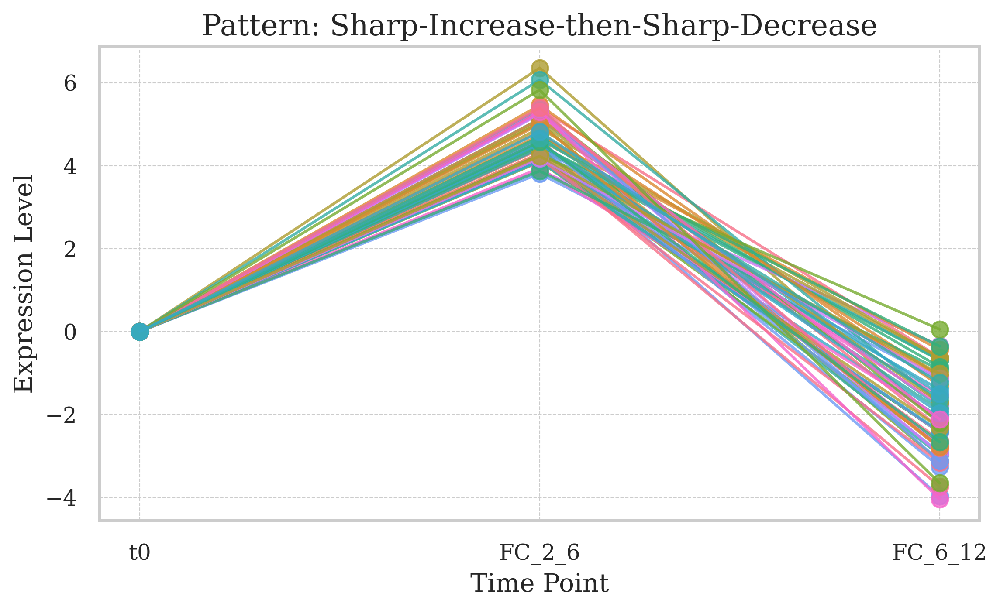

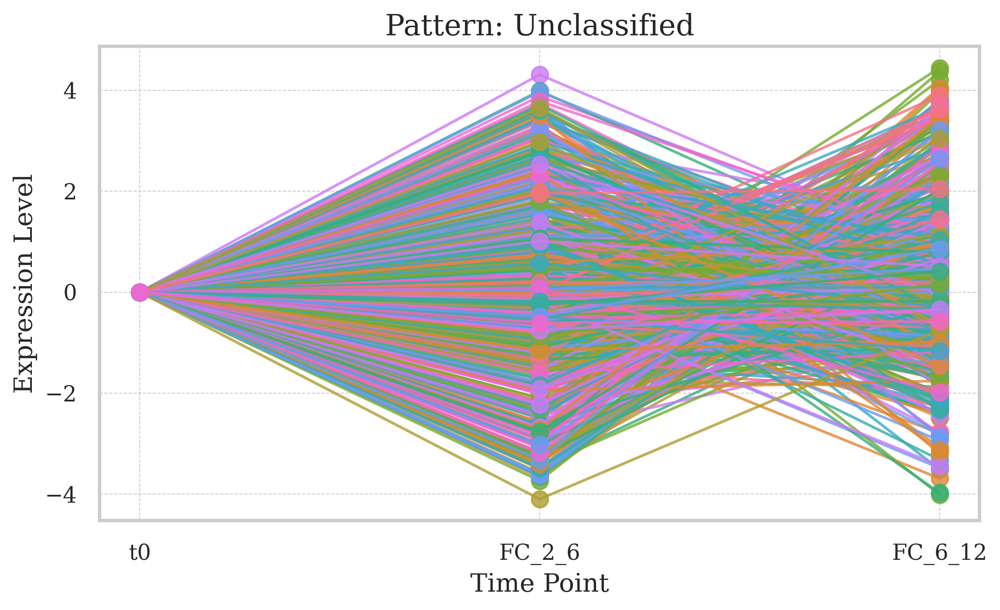

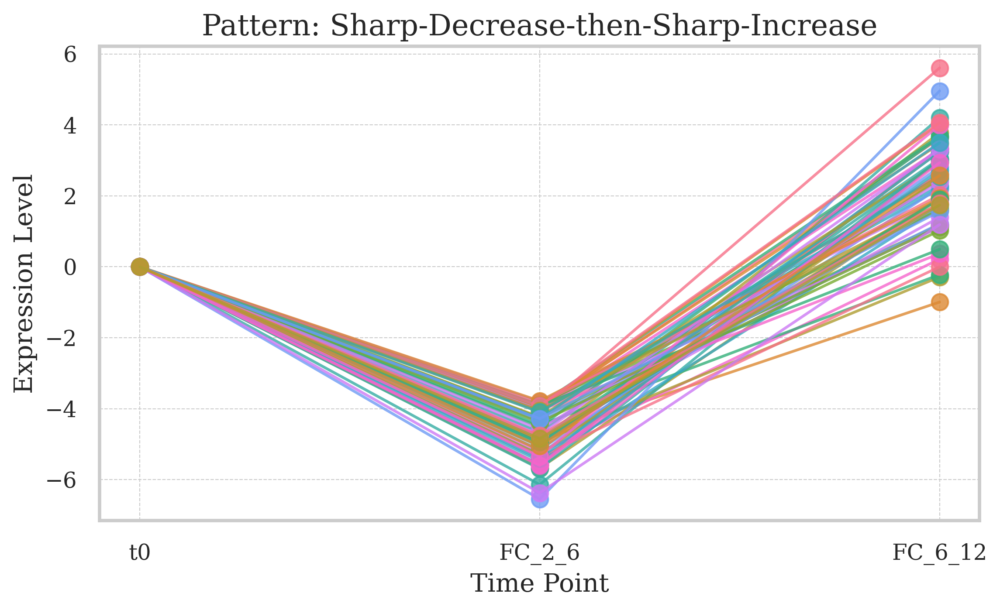

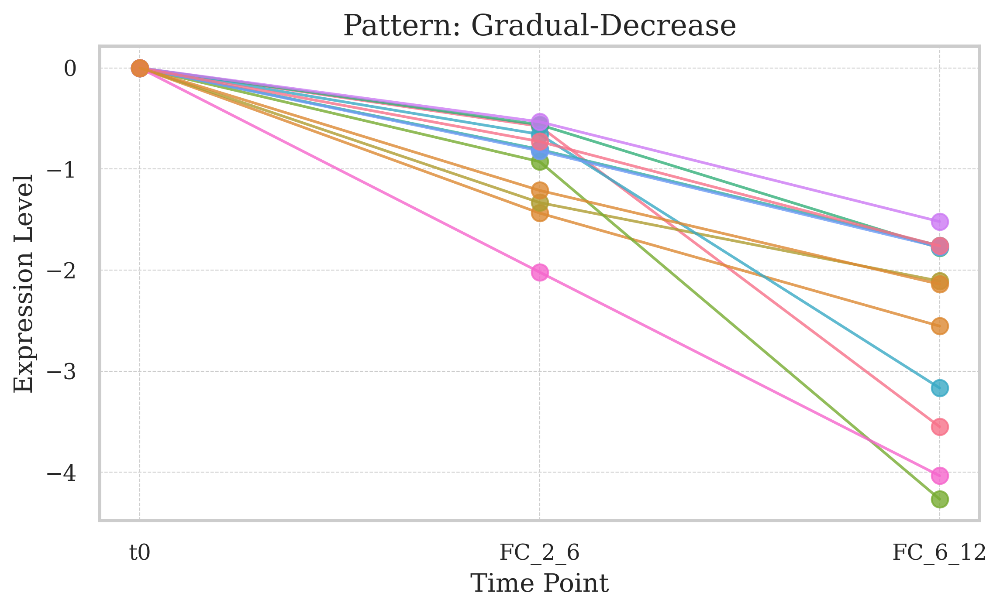

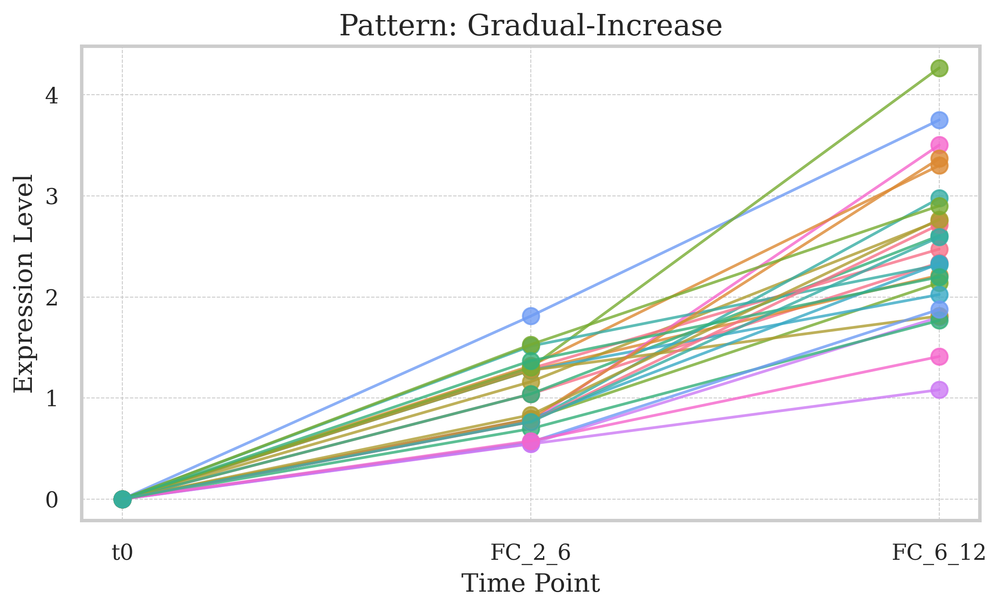

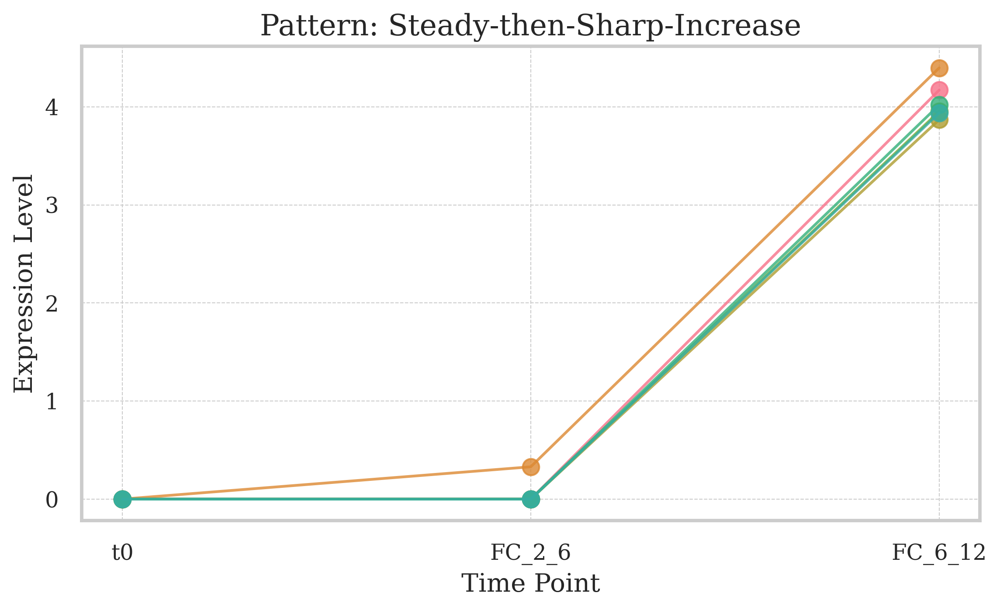

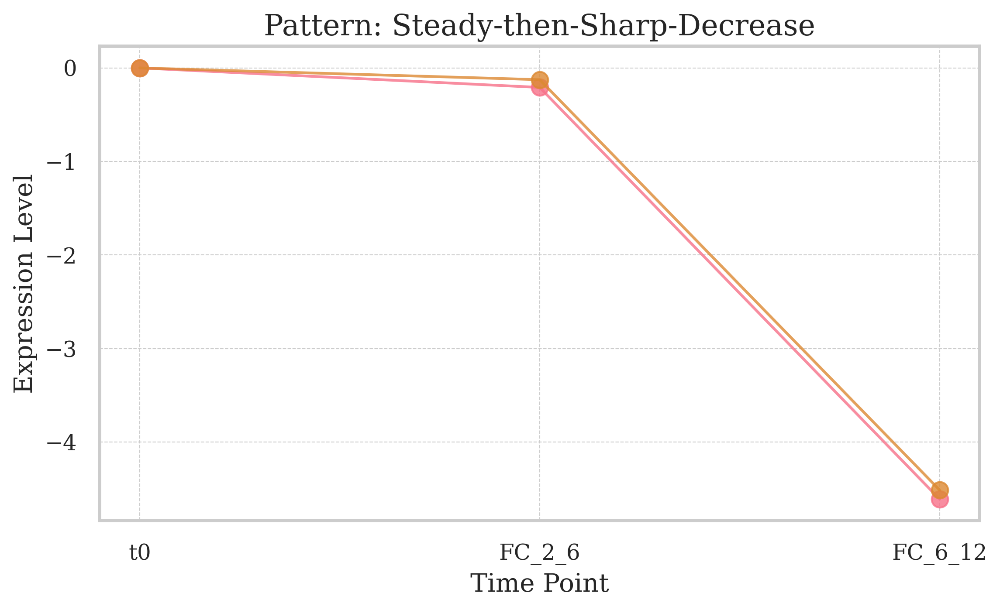

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams

# Use Nature-like plotting styles
sns.set(style='whitegrid', context='talk', palette='Set2')
rcParams['font.family'] = 'serif'
rcParams['figure.dpi'] = 300

# Define color palette
palette = sns.color_palette("husl", n_colors=10)  # Good distinct hues

# Your classification function here (unchanged)
# compute_angle and classify_pattern as previously defined

# Apply classification
data_m['pattern'] = data_m.apply(classify_pattern, axis=1)

# Plot grouped by pattern
timepoints = ['t0', 'FC_2_6', 'FC_6_12']
unique_patterns = data_m['pattern'].unique()

for pattern in unique_patterns:
    subset = data_m[data_m['pattern'] == pattern]
    plt.figure(figsize=(8, 5))

    for i, (_, row) in enumerate(subset.iterrows()):
        color = palette[i % len(palette)]
        plt.plot(timepoints, row[timepoints], marker='o', linewidth=1.5, alpha=0.8, color=color)

    plt.title(f'Pattern: {pattern}', fontsize=16)
    plt.xlabel('Time Point', fontsize=14)
    plt.ylabel('Expression Level', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.grid(True, linestyle='--', linewidth=0.5)

    # Optional: comment this if too many lines
    # plt.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0), fontsize=8)

    plt.show()


In [65]:
import pandas as pd
import numpy as np

# Helper: compute angle between time points (in degrees)
def compute_angle(delta_expr, delta_time=6.55):
    slope = delta_expr / delta_time
    angle = np.degrees(np.arctan(slope))
    return angle

# Classification function with angles
def classify_pattern(row, angle_thresh=22.5, steady_thresh=4.5):
    delta1 = row['FC_2_6'] - row['t0']
    delta2 = row['FC_6_12'] - row['FC_2_6']
    
    angle1 = compute_angle(delta1)
    angle2 = compute_angle(delta2)

    if abs(angle1) < steady_thresh and angle2 > angle_thresh:
        return 'Steady-then-Sharp-Increase'
    elif abs(angle1) < steady_thresh and angle2 < -angle_thresh:
        return 'Steady-then-Sharp-Decrease'
    elif angle1 > angle_thresh and angle2 < -angle_thresh:
        return 'Sharp-Increase-then-Sharp-Decrease'
    elif angle1 < -angle_thresh and angle2 > angle_thresh:
        return 'Sharp-Decrease-then-Sharp-Increase'
    elif angle1 > steady_thresh and angle2 > steady_thresh:
        return 'Gradual-Increase'
    elif angle1 < -steady_thresh and angle2 < -steady_thresh:
        return 'Gradual-Decrease'
    else:
        return 'Unclassified'

# Apply classification
data_m['pattern'] = data_m.apply(classify_pattern, axis=1)

# Create dictionary to store miRNA_IDs by pattern
pattern_groups = {}

for pattern in data_m['pattern'].unique():
    miRNAs = data_m[data_m['pattern'] == pattern]['miRNA_ID'].tolist()
    pattern_groups[pattern] = miRNAs

    # Save each pattern group to a separate file
    with open(f'{pattern.replace(" ", "_")}.txt', 'w') as f:
        for mirna in miRNAs:
            f.write(f"{mirna}\n")


In [70]:
import pandas as pd
import numpy as np

# Helper: compute angle between time points (in degrees)
def compute_angle(delta_expr, delta_time=6.55):
    slope = delta_expr / delta_time
    angle = np.degrees(np.arctan(slope))
    return angle

# Classification function with angles
def classify_pattern(row, angle_thresh=22.5, steady_thresh=4.5):
    delta1 = row['FC_2_6'] - row['t0']
    delta2 = row['FC_6_12'] - row['FC_2_6']
    
    angle1 = compute_angle(delta1)
    angle2 = compute_angle(delta2)

    if abs(angle1) < steady_thresh and angle2 > angle_thresh:
        return 'Steady-then-Sharp-Increase'
    elif abs(angle1) < steady_thresh and angle2 < -angle_thresh:
        return 'Steady-then-Sharp-Decrease'
    elif angle1 > angle_thresh and angle2 < -angle_thresh:
        return 'Sharp-Increase-then-Sharp-Decrease'
    elif angle1 < -angle_thresh and angle2 > angle_thresh:
        return 'Sharp-Decrease-then-Sharp-Increase'
    elif angle1 > steady_thresh and angle2 > steady_thresh:
        return 'Gradual-Increase'
    elif angle1 < -steady_thresh and angle2 < -steady_thresh:
        return 'Gradual-Decrease'
    else:
        return 'Unclassified'

# Apply classification
data_m['pattern'] = data_m.apply(classify_pattern, axis=1)

# Create dictionary to store miRNA_IDs by pattern
pattern_groups = {}

for pattern in data_m['pattern'].unique():
    miRNAs = data_m[data_m['pattern'] == pattern]['miRNA_ID'].tolist()
    pattern_groups[pattern] = miRNAs

    # Save each pattern group to a separate file with header
    filename = f"{pattern.replace(' ', '_')}.txt"
    with open(filename, 'w') as f:
        f.write(f"{pattern}\n")  # Write pattern name as column header
        for mirna in miRNAs:
            f.write(f"{mirna}\n")


In [71]:
path2 = Path("/Users/zainabnazari/mfuzz/")

In [72]:
data_r1 = pd.read_csv(path2/"Steady-then-Sharp-Increase.txt")

In [73]:
data_r1

,Steady-then-Sharp-Increase
0,mmu-miR-1951
1,mmu-miR-224-5p
2,mmu-miR-302b-3p
3,mmu-miR-3070-2-3p
4,mmu-miR-3075-5p
5,mmu-miR-3544-5p
6,mmu-miR-5134-5p
7,mmu-miR-6918-5p
8,mmu-miR-6962-3p
9,mmu-miR-6977-3p


In [74]:
data_r2 = pd.read_csv(path2/"Steady-then-Sharp-Decrease.txt")

In [75]:
data_r2

,Steady-then-Sharp-Decrease
0,mmu-miR-215-5p
1,mmu-miR-23a-5p
2,mmu-miR-297c-5p
3,mmu-miR-6546-3p
4,mmu-miR-6926-5p
5,mmu-miR-7214-3p
6,mmu-miR-742-5p
7,mmu-miR-7688-3p


In [76]:
data_r3 = pd.read_csv(path2/"Sharp-Increase-then-Sharp-Decrease.txt")

In [77]:
data_r3

,Sharp-Increase-then-Sharp-Decrease
0,mmu-let-7a-2-3p
1,mmu-miR-12184-3p
2,mmu-miR-12199-3p
3,mmu-miR-148a-5p
4,mmu-miR-185-3p
...,...
101,mmu-miR-8099
102,mmu-miR-8116
103,mmu-miR-8117
104,mmu-miR-879-3p


In [78]:
data_r4 = pd.read_csv(path2/"Sharp-Decrease-then-Sharp-Increase.txt")
data_r4

,Sharp-Decrease-then-Sharp-Increase
0,mmu-miR-105
1,mmu-miR-1191b-3p
2,mmu-miR-1191b-5p
3,mmu-miR-12178-3p
4,mmu-miR-12197-3p
...,...
123,mmu-miR-8101
124,mmu-miR-878-3p
125,mmu-miR-883a-3p
126,mmu-miR-92a-2-5p


In [79]:
data_r5 = pd.read_csv(path2/"Gradual-Increase.txt")
data_r5

,Gradual-Increase
0,mmu-miR-12185-5p
1,mmu-miR-12186-3p
2,mmu-miR-12192-5p
3,mmu-miR-12203-3p
4,mmu-miR-1a-1-5p
5,mmu-miR-3094-5p
6,mmu-miR-365-1-5p
7,mmu-miR-6769b-3p
8,mmu-miR-6907-3p
9,mmu-miR-6917-3p


In [80]:
data_r5 = pd.read_csv(path2/"Gradual-Decrease.txt")
data_r5

,Gradual-Decrease
0,mmu-miR-12182-5p
1,mmu-miR-1264-3p
2,mmu-miR-1298-5p
3,mmu-miR-208a-5p
4,mmu-miR-20a-3p
5,mmu-miR-351-3p
6,mmu-miR-6365
7,mmu-miR-670-3p
8,mmu-miR-6973a-5p
9,mmu-miR-7089-5p
